# Import libraries

In [1]:
import sys
sys.path.insert(0,'..')

In [14]:
import os
import sys
from pathlib import Path

import pandas as pd
import numpy as np
import pickle
import matplotlib.pyplot as plt
import matplotlib as mpl
import matplotlib.dates as mdates
from matplotlib import colors
import h5py
import re
from typing import Optional
import datetime as dt
import matplotlib.patches as mpatches
from functools import partial
from multiprocessing import Pool

#from lhcsmapi.Time import Time
#from lhcsmapi.Timer import Timer
#from lhcsmapi.metadata.MappingMetadata import MappingMetadata
from scipy import signal
import xarray as xr
import numpy as np
from sklearn.manifold import TSNE
from sklearn.preprocessing import StandardScaler
from sklearn.cluster import KMeans
from scipy.signal import find_peaks
from sklearn import preprocessing


from src.dataset import load_dataset
from src.datasets.rb_fpa_prim_quench_ee_plateau import RBFPAPrimQuenchEEPlateau
from src.datasets.rb_fpa_prim_quench_ee_plateau2 import RBFPAPrimQuenchEEPlateau2
from src.datasets.rb_fpa_full_quench import RBFPAFullQuench
from src.utils.frequency_utils import get_fft_of_DataArray, scale_fft_amplitude
from src.visualisation.fft_visualisation import plot_nmf_components, plot_position_frequency_map, plot_NMF, plot_nmf_event_composition, plot_avg_component_weight, plot_distribution_over_column, plot_component_distribution, plot_cweight_distribution_all_data
from src.visualisation.visualisation import make_gif
from src.models.nmf import NMF
from src.utils.utils import pd_dict_filt, nanargsort, merge_array
from src.utils.sort_utils import map_position_index, center_array, split_main_mirror, calc_snr, main_mirror_to_el, generate_sorted_value_dict

pd.set_option('display.max_rows', 200)
import warnings
warnings.filterwarnings('ignore')

# Define Paths

In [3]:
file_path  = Path('/eos/project/m/ml-for-alarm-system/private/RB_signals')
data_path = file_path / 'backup/20220707_data'
simulation_path = file_path / 'backup/20220707_simulation'

# Read the (clean) MP3 file

In [4]:
mp3_fpa_df = pd.read_csv("../data/RB_TC_extract_2022_07_07_processed_filled.csv")
mp3_fpa_df_unique = mp3_fpa_df.drop_duplicates(subset=['fpa_identifier'])

len(mp3_fpa_df), len(mp3_fpa_df_unique)

(3981, 822)

In [5]:
mp3_fpa_df_unique['I_Q_kA'] = mp3_fpa_df_unique["I_Q_M"].apply(lambda x: np.round(x / 1e3)*1e3)
mp3_fpa_df_unique['dI_dt_from_data_round'] = mp3_fpa_df_unique["dI_dt_from_data"].apply(lambda x: int(np.round(x)))

mp3_fpa_df_unique['datetime'] = pd.to_datetime(mp3_fpa_df_unique['Date (FGC)'])
mp3_fpa_df_unique['year'] = mp3_fpa_df_unique['datetime'].apply(lambda x: x.year)
mp3_fpa_df_unique['month'] = mp3_fpa_df_unique['datetime'].apply(lambda x: x.month)
mp3_fpa_df_unique['day'] = mp3_fpa_df_unique['datetime'].apply(lambda x: x.day)

# Read metadata

In [6]:
metadata_path = Path("../data/RB_metadata.csv")
rb_magnet_metadata = pd.read_csv(metadata_path, index_col=False)
rb_magnet_metadata

,Circuit,Magnet,Position,B1_aperture,Diode_type,Correctors,EE place,#Electric_EE,#Electric_circuit,Cryostat,...,age,Manufacturer,Inner cable type,Outer cable type,I_Q_SM18,Renamed short magnet ID,MTF Status,Magnet_construction_order,QPS Crate Number,Cryostat Number
0,RB.A12,MB.A8R1,276.7340,EXT,R,A,EVEN,1,78,LBARE.8R1,...,14.0,3.0,01B,02B8,11488.0,NaN,NaN,288,0,0
1,RB.A12,MB.B8R1,292.3940,EXT,R,B,ODD,77,77,LBBRF.8R1,...,14.0,2.0,01E,02C0,10622.0,NaN,NaN,256,0,1
2,RB.A12,MB.A9R1,315.7990,EXT,R,A,EVEN,2,79,LBARE.9R1,...,14.0,2.0,01E,02C9,12427.0,NaN,NaN,330,1,0
3,RB.A12,MB.B9R1,331.4590,EXT,R,B,ODD,76,76,LBBRG.9R1,...,14.0,2.0,01E,02C9,11155.0,NaN,NaN,319,2,1
4,RB.A12,MB.A10R1,356.2640,EXT,R,A,EVEN,3,80,LBARE.10R1,...,14.0,1.0,01E,02B8,11782.0,NaN,NaN,296,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1227,RB.A81,MB.A10L1,26302.6192,INT,L,B,ODD,75,75,LBBLG.10L1,...,14.0,3.0,01B,02G,12645.0,NaN,NaN,123,1,1
1228,RB.A81,MB.B9L1,26327.4242,INT,L,A,EVEN,2,79,LBALE.9L1,...,14.0,1.0,01B,02B5,12379.0,NaN,NaN,62,1,0
1229,RB.A81,MB.A9L1,26343.0842,INT,L,B,ODD,76,76,LBBLF.9L1,...,14.0,2.0,01B,02K,11757.0,NaN,NaN,61,2,1
1230,RB.A81,MB.B8L1,26366.4892,INT,L,A,EVEN,1,78,LBALE.8L1,...,14.0,3.0,01B,02G,11656.0,NaN,NaN,172,0,0


In [7]:
mp3_fpa_df_unique = mp3_fpa_df_unique.merge(rb_magnet_metadata,
                                            left_on=["Magnet"],
                                            right_on=["Magnet"],
                                            how="left", suffixes=('', '_y'))

drop_columns = mp3_fpa_df_unique.filter(regex='Unnamed').columns.to_list()
drop_columns += mp3_fpa_df_unique.filter(regex='_y').columns.to_list()
mp3_fpa_df_unique = mp3_fpa_df_unique.drop(columns=drop_columns)

# Load description of context variables

In [8]:
df_feature_context = pd.read_excel("../data/metadata_context_variables.xlsx", engine='openpyxl', index_col="Unnamed: 0")

df_feature_context['nunique'] = mp3_fpa_df_unique[df_feature_context.index.values].nunique()
df_feature_context['nmissing'] = mp3_fpa_df_unique[df_feature_context.index.values].isna().sum()
df_feature_context

,dtype,ftype,one_hot,group,nunique,nmissing,units,comment
Circuit,<class 'str'>,event,True,circuit,8,0,NaN,['RB.A12' 'RB.A23' 'RB.A34' 'RB.A45' 'RB.A56' ...
timestamp_fgc,<class 'int'>,event,False,timing,822,0,[us],Unix timestamp of FPA
Delta_t(FGC-PIC),<class 'float'>,event,False,acquisition_systems,29,261,[ms],Difference in acquisition systems
Delta_t(EE_even-PIC),<class 'float'>,event,False,acquisition_systems,37,0,[ms],Difference in acquisition systems
Delta_t(EE_odd-PIC),<class 'float'>,event,False,acquisition_systems,48,0,[ms],Difference in acquisition systems
Delta_t(iQPS-PIC),<class 'float'>,event,False,acquisition_systems,37,0,[ms],Difference in acquisition systems
Delta_t(nQPS-PIC),<class 'float'>,event,False,acquisition_systems,48,263,[ms],Difference in acquisition systems
Plateau duration,<class 'float'>,event,False,operation,70,231,[s],Duration of stable current before FPA
t_EE_odd,<class 'float'>,event,False,acquisition_systems,48,0,[s],Time of activation of odd EE
t_EE_even,<class 'float'>,event,False,acquisition_systems,37,0,[s],Time of activation of odd EE


# Load Data

In [17]:
dataset_path_1EE = Path("/eos/project/m/ml-for-alarm-system/private/RB_signals/backup/20220707_prim_ee_plateau_dataset")
dataset_path_2EE = Path("/eos/project/m/ml-for-alarm-system/private/RB_signals/backup/20220707_RBFPAPrimQuenchEEPlateau2")

dataset_creator_1EE = RBFPAPrimQuenchEEPlateau()
dataset_creator_2EE = RBFPAPrimQuenchEEPlateau2()

all_fpa_identifiers = mp3_fpa_df.fpa_identifier.unique()

dataset_1EE = dataset_creator_1EE.load_dataset(fpa_identifiers=all_fpa_identifiers,
                                       dataset_path=dataset_path_1EE,
                                       drop_data_vars=['simulation'])

dataset_2EE = dataset_creator_2EE.load_dataset(fpa_identifiers=all_fpa_identifiers,
                                       dataset_path=dataset_path_2EE,
                                       drop_data_vars=['simulation'])

f_lim = (0, 534)
dataset_1EE_fft = get_fft_of_DataArray(data=dataset_1EE.data)
dataset_2EE_fft = get_fft_of_DataArray(data=dataset_2EE.data)

f_window = np.hanning
dataset_1EE_fft = scale_fft_amplitude(data=dataset_1EE_fft, f_window=f_window)
dataset_1EE_fft = dataset_1EE_fft[:, :, dataset_1EE_fft.frequency < f_lim[1]]
dataset_1EE_fft = dataset_1EE_fft[:, :, dataset_1EE_fft.frequency < f_lim[1]]

# postprocess fft data
data_1EE_ff_scaled = np.array([dataset_creator_1EE.log_scale_data(x) for x in dataset_1EE_fft.data])
data_2EE_ff_scaled = np.array([dataset_creator_2EE.log_scale_data(x) for x in dataset_2EE_fft.data])

data_1EE = np.nan_to_num(data_1EE_ff_scaled.reshape(-1, np.shape(data_1EE_ff_scaled)[2]))
data_2EE = np.nan_to_num(data_2EE_ff_scaled.reshape(-1, np.shape(data_2EE_ff_scaled)[2]))

In [21]:
data_1EE

array([[1.        , 1.        , 1.        , ..., 0.60179994, 0.63256028,
        0.61093272],
       [0.        , 0.        , 0.        , ..., 0.        , 0.        ,
        0.        ],
       [1.        , 1.        , 1.        , ..., 0.44367347, 0.38270271,
        0.37622749],
       ...,
       [1.        , 1.        , 1.        , ..., 0.54583566, 0.57369804,
        0.48067954],
       [0.        , 0.        , 0.        , ..., 0.        , 0.        ,
        0.        ],
       [1.        , 1.        , 1.        , ..., 0.56710952, 0.38908999,
        0.3712941 ]])

## Define training data

In [18]:
# all events with successfully loaded data
fpa_identifiers = all_fpa_identifiers[np.isin(all_fpa_identifiers, dataset_1EE.event.values)] 

# model is not trained on data before 2021 and events with fast secondary quenches
bool_R2 =  (mp3_fpa_df['timestamp_fgc'] < 1611836512820000000)
bool_fast = ((mp3_fpa_df['Delta_t(iQPS-PIC)'] / 1000 < 5) & (mp3_fpa_df['Nr in Q event'].astype(str) !='1')) 
bool_test = bool_R2 | bool_fast
            
fpa_identifiers_test = fpa_identifiers[np.isin(fpa_identifiers, mp3_fpa_df[bool_test].fpa_identifier.unique())]
fpa_identifiers_fast = fpa_identifiers[np.isin(fpa_identifiers, mp3_fpa_df[bool_fast].fpa_identifier.unique())]

bool_train = ~np.isin(fpa_identifiers, fpa_identifiers_test)
fpa_identifiers_train = fpa_identifiers[bool_train]
print(len(fpa_identifiers_train), len(fpa_identifiers_test))

# add dims for indexing flattended data
bool_train_1EE = np.stack([bool_train for l in range(data_1EE_ff_scaled.shape[1])]).T.reshape(-1)
bool_train_2EE = np.stack([bool_train for l in range(data_2EE_ff_scaled.shape[1])]).T.reshape(-1)

425 135


# <h1><center><font size="30">Non-negative components - NMF</font></center></h1>

<h1><font size="8">1st Energy Extraction Plateau</font></h1>

In [36]:
hyperparameter = {
    "n_components": 15,
    "solver": "cd",
    "beta_loss": 'frobenius',
    "init": "nndsvd",
    "tol": 1e-3,
    "max_iter": 200,
    "l1_ratio": 0.5,
    "alpha": 1,
    "shuffle": "False",
    "ortho_reg": 0 
}
nmf_model = NMF(**hyperparameter)
nmf_model.fit(X=data_1EE[bool_train_1EE])
W_1EE = nmf_model.transform(X=data_1EE)
H_1EE = nmf_model.components_

#plot_nmf_components(H_1EE, dataset_1EE_fft)

array([ 6.499197  ,  8.17496083,  7.43770594,  1.96941621,  2.45392433,
        6.59047096,  0.        ,  6.53098829, 10.00315741,  8.77178344,
        4.54737897,  0.        ,  0.        ,  0.        ,  4.9538208 ])

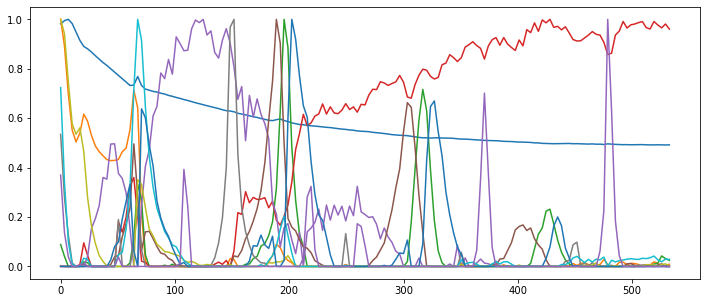

In [44]:
plt.figure(figsize=(12,5))
plt.plot(dataset_1EE_fft.frequency, )
plt.show()

In [45]:
pd.DataFrame(H_1EE.T / np.max(H_1EE, axis=1), index=dataset_1EE_fft.frequency).to_csv('manual_compontents.csv')

In [ ]:
merge_component_index = [0, [2, 6], [1, 3, 4, 7, 8], 5, 9] #[0, 1, 2, 3, 4, 5, 6, 7, 8, 9] #
H_1EE_merged = merge_array(H_1EE.T, merge_component_index, axis=-1, func=np.sum).T
W_1EE_merged = merge_array(W_1EE, merge_component_index, axis=-1, func=np.mean)

H_1EE_processed, component_weights_1EE = nmf_model.normalize_H(H=H_1EE_merged, W=W_1EE_merged)
plot_nmf_components(H_1EE_merged, dataset_1EE_fft)

## Check components

In [13]:
use_fpa_identifier = False
if use_fpa_identifier:
    # provide fpa_identifier
    fpa_identifier = 'RB_RB.A78_1617170255140000000'
    event_idex = np.argmax(fpa_identifiers == fpa_identifier)
else: 
    # provide event_index 
    event_idex = 0 #30
    dataset_fft_cut = dataset_1EE_fft.loc[{'event': fpa_identifiers}]
    fpa_identifier =  dataset_fft_cut[{'event': event_idex}].event.values

date = mp3_fpa_df[mp3_fpa_df.fpa_identifier == fpa_identifier]['Timestamp_PIC'].values[0]
event_idex, fpa_identifier, date

(0, array('RB_RB.A12_1543810849860000000', dtype='<U29'), nan)

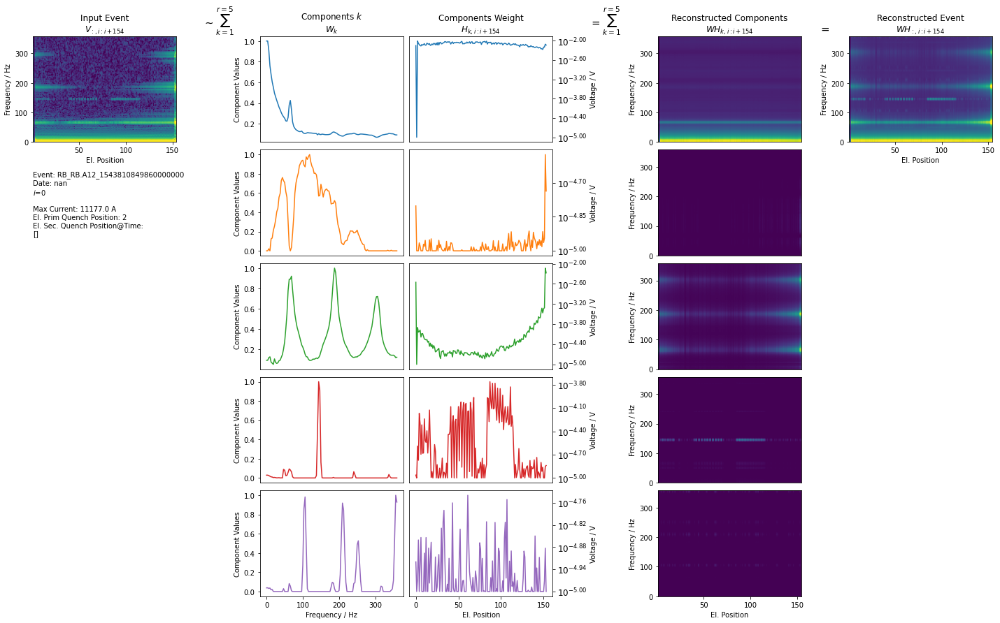

In [14]:
component_indexes_1EE = [0, 1, 2, 3, 4] 
plot_nmf_event_composition(data_1EE, component_weights_1EE, H_1EE_processed, component_indexes_1EE, dataset_1EE_fft, fpa_identifier, mp3_fpa_df)

# Find anomalies: analyze events from same magnet

In [40]:
min_events = 2
bool_args = mp3_fpa_df_unique.fpa_identifier.isin(fpa_identifiers) & (mp3_fpa_df_unique.age >  4) & (~mp3_fpa_df_unique.fpa_identifier.isin(fpa_identifiers_fast))
df_trend_magnets = (mp3_fpa_df_unique[bool_args].Magnet.value_counts().to_frame() >= min_events)
df_magnets = df_trend_magnets[df_trend_magnets.Magnet == True]

trend_components = [1, 2]

for trend_magnets in df_trend_magnets[df_trend_magnets.Magnet == True].index:
    df_trend = mp3_fpa_df_unique[mp3_fpa_df_unique.Magnet == trend_magnets]
    event_idx = np.isin(fpa_identifiers, df_trend.fpa_identifier.values)
    
    c_trend = np.polyfit(np.arange(len(df_trend.I_Q_M.values)), df_trend.I_Q_M.values, 1)[0]
    df_magnets.loc[trend_magnets, f"current_trend"] = c_trend
    
    for j, c in enumerate(trend_components):
        component_energy = np.sum(component_weights_1EE.reshape(-1,154,5)[event_idx,:,c]**2, axis=1)
        
        trend = np.polyfit(np.arange(len(component_energy)), component_energy, 1)[0]
        df_magnets.loc[trend_magnets, f"trend_component_{c}"] = trend
        
df_outliers = df_magnets[((df_magnets.trend_component_1 > 0) | (df_magnets.trend_component_2 > 0))].sort_values(by="trend_component_2", ascending=False) #  & (df_magnets.current_trend < 100) 
df_outliers       

,Magnet,current_trend,trend_component_1,trend_component_2
MB.C21R4,True,277.0,0.040220,10.261796
MB.A25R1,True,416.5,0.027081,6.646330
MB.A22L8,True,245.0,0.023787,6.288104
MB.B27R4,True,244.0,0.040203,5.608709
MB.C28L5,True,754.8,0.028840,4.763650
MB.A27L8,True,314.5,0.034969,4.162785
MB.C32R5,True,484.0,-0.004205,3.523194
MB.A30L4,True,393.0,-0.015459,2.633518
MB.A9R4,True,159.0,0.002655,1.969788
MB.C34R7,True,489.0,-0.005528,1.569595


MB.C21R4
['RB_RB.A45_1620626261560000000' 'RB_RB.A45_1622655358820000000']
MB.A25R1
['RB_RB.A12_1620547767320000000' 'RB_RB.A12_1621877030040000000']
MB.A22L8
['RB_RB.A78_1615788516120000000' 'RB_RB.A78_1635921628760000000']
MB.B27R4
['RB_RB.A45_1620583965640000000' 'RB_RB.A45_1622841139920000000']
MB.C28L5
['RB_RB.A45_1540946196440000000' 'RB_RB.A45_1540964683040000000'
 'RB_RB.A45_1621277927780000000']
MB.A27L8
['RB_RB.A78_1615443988700000000' 'RB_RB.A78_1636527821260000000']
MB.C32R5
['RB_RB.A56_1621703985980000000' 'RB_RB.A56_1624998329020000000']
MB.A30L4
['RB_RB.A34_1619332155620000000' 'RB_RB.A34_1619361063480000000']
MB.A9R4
['RB_RB.A45_1619933178100000000' 'RB_RB.A45_1620710483460000000']
MB.C34R7
['RB_RB.A78_1615566065200000000' 'RB_RB.A78_1636190439220000000']
MB.C28R4
['RB_RB.A45_1620537507500000000' 'RB_RB.A45_1622303226960000000']
MB.C27L4
['RB_RB.A34_1617389807160000000' 'RB_RB.A34_1619891288980000000']
MB.A15L8
['RB_RB.A78_1616777069680000000' 'RB_RB.A78_163695651414000

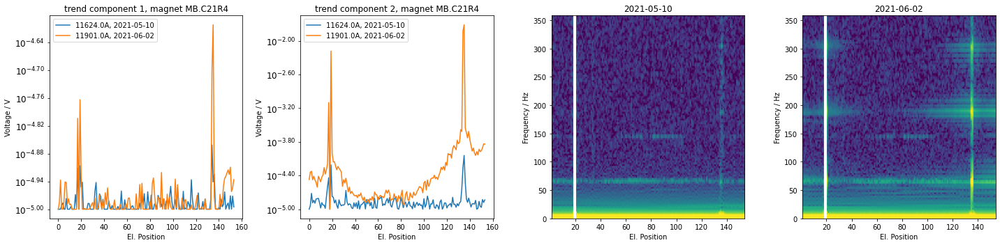

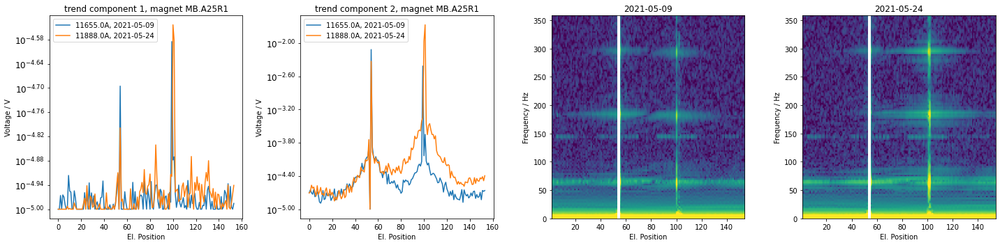

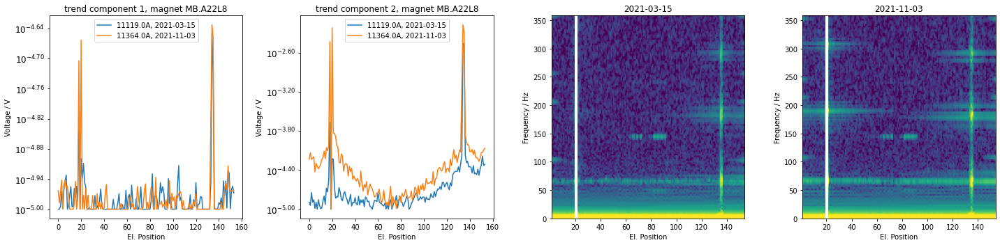

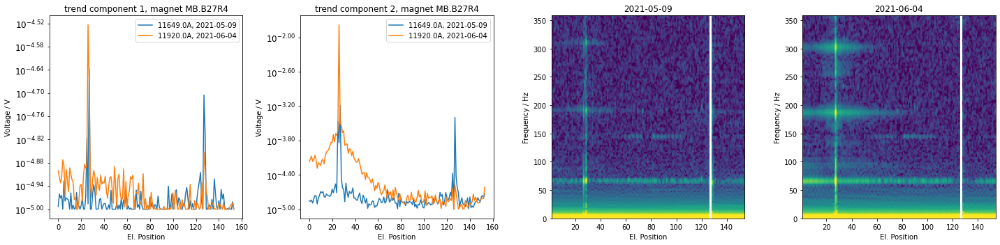

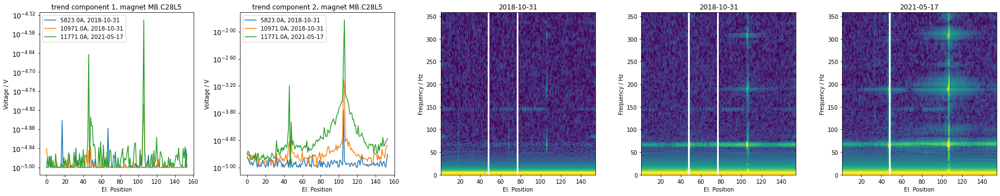

...

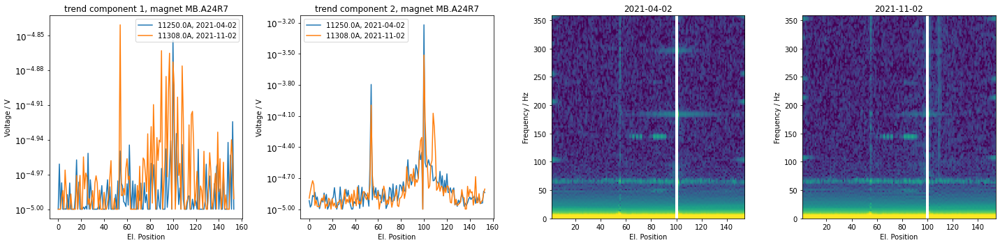

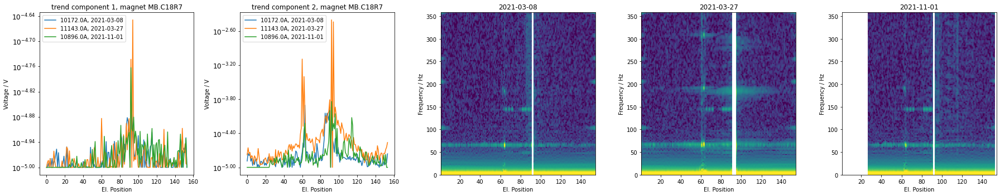

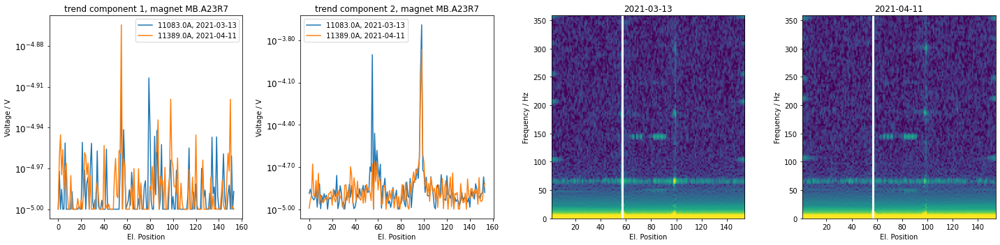

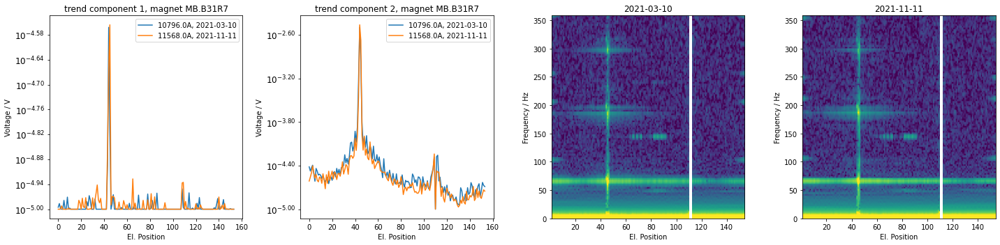

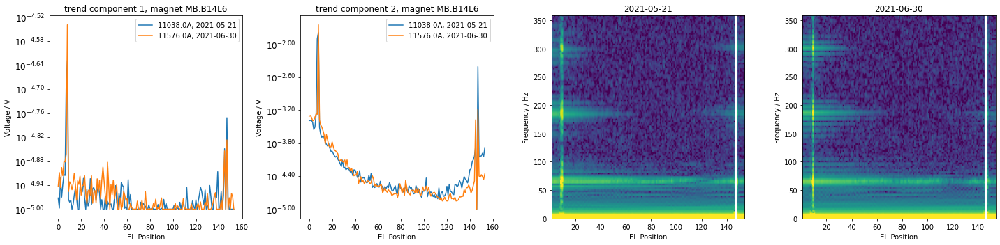

In [41]:
trend_components = [1, 2]

for trend_magnets in df_outliers.index: # df_trend_magnets[df_trend_magnets.Magnet == True]
    df_trend = mp3_fpa_df_unique[mp3_fpa_df_unique.Magnet == trend_magnets]
    event_idx = np.isin(fpa_identifiers, df_trend.fpa_identifier.values)
    df_trend = df_trend[df_trend.fpa_identifier.isin(fpa_identifiers)]
    
    n_plots = len(trend_components) +sum(event_idx)
    fig, ax = plt.subplots(1, n_plots, figsize=(5*n_plots,5))
    
    for j, c in enumerate(trend_components):
        component_weight = component_weights_1EE.reshape(-1,154,5)[event_idx,:,c]
        ax[j].plot(component_weight.T)
        ax[j].set_title(f"trend component {c}, magnet {trend_magnets}")
        ax[j].legend([f"{I}A, {d}" for I, d in zip(df_trend.I_Q_M.values, df_trend['datetime'].dt.strftime('%Y-%m-%d').values)])
        ax[j].set_xlabel("El. Position")
        ax[j].set_ylabel("Voltage / V")
        
        yticks = ax[j].get_yticks().tolist()
        ax[j].set_yticklabels([f"$10^{{{(3*a-5):.2f}}}$" for a in yticks], fontsize="large")
        ax[j].set_ylabel("Voltage / V")

    for k, trend_event in enumerate(np.arange(len(event_idx))[event_idx]):
        plot_position_frequency_map(ax[k + len(trend_components)], dataset_1EE_fft.data[trend_event], dataset_1EE_fft.frequency)
        ax[k + len(trend_components)].set_title(f"{df_trend['datetime'].dt.strftime('%Y-%m-%d').values[k]}")
        ax[k + len(trend_components)].set_xlabel("El. Position")
        ax[k + len(trend_components)].set_ylabel("Frequency / Hz")
        
    print(trend_magnets)
    print(fpa_identifiers[event_idx])

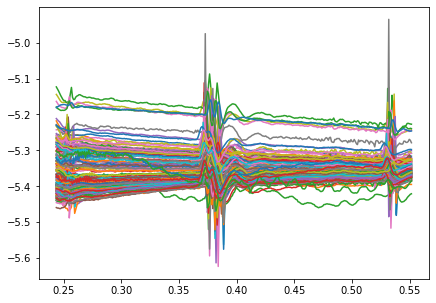

In [278]:
plt.figure(figsize=(7,5)) # Ask zinur
example = 'RB_RB.A67_1628099016180000000'
plt.plot(dataset_1EE.loc[{'event': example}].time, dataset_1EE.loc[{'event': example}].data.T)
plt.show()